# Рынок заведений общественного питания Москвы

## Описание
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Требуется подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл moscow_places.csv содержит :
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
      и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Ход исследования
Исследование пройдёт в следующем порядке:
- Загрузка данных и общая информация
- Предварительная обработка 
- Анализ данных
- Детальное исследование

# Загрузка данных и общая информация

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import re
import folium
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем карту и хороплет
from folium import Map, Choropleth
import plotly.graph_objects as go
import warnings
warnings.simplefilter('ignore')

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.shape

(8406, 14)

In [3]:
data.info()
data.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
# проверим колеичество дубликатов в датасете
data.duplicated().sum()

0

In [5]:
dupl =  data[data.duplicated(subset = ['name', 'address'])]
print(dupl.info())
dupl[['name','address']]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               0 non-null      object 
 1   category           0 non-null      object 
 2   address            0 non-null      object 
 3   district           0 non-null      object 
 4   hours              0 non-null      object 
 5   lat                0 non-null      float64
 6   lng                0 non-null      float64
 7   rating             0 non-null      float64
 8   price              0 non-null      object 
 9   avg_bill           0 non-null      object 
 10  middle_avg_bill    0 non-null      float64
 11  middle_coffee_cup  0 non-null      float64
 12  chain              0 non-null      int64  
 13  seats              0 non-null      float64
dtypes: float64(6), int64(1), object(7)
memory usage: 0.0+ bytes
None


,name,address


In [6]:
# проверим количество пропусков в датасете
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

#### Вывод
 - всего в данных храниться информация о 8406 заведениях
 - типы данных у всех столбцов верные (кроме seats нужно перевести в int)
 - дубликатов нет
 - пропуски присутствуют в 6 столбцах
 - больше всего пропусков в seats, avg_bill, price, middle_avg_bill, middle_coffee_cup
 - нужно как-то обработать столбцы hours и avg_bill чтобы достать от туда нужную информацию

### Обработка данных

In [7]:
print('Count rows with all problem data columns (without `hours`):', end=' ')
print(len(data.query('seats != seats & avg_bill!=avg_bill & price!=price &\
        middle_avg_bill!=middle_avg_bill & middle_coffee_cup!=middle_coffee_cup')))

print('Count rows with ALL problem data columns:', end=' ')
print(len(data.query('seats != seats & avg_bill!=avg_bill & price!=price &\
        middle_avg_bill!=middle_avg_bill & middle_coffee_cup!=middle_coffee_cup & hours!=hours')))

Count rows with all problem data columns (without `hours`): 2072
Count rows with ALL problem data columns: 235


В некоторых столбцах пропусков очень много, но на данный момент заменить их не получится.
Так же есть строки с пропусками во всех "проблемных" столбцах 2072 строки (исключая hours) и 235 строк (включая hours). 
Даже эти строки с пропусками содержат информацию о положении и типе заведения, считаю что удалять их пока что рано.

In [8]:
# Для начала переведем все строковые данные в нижний регистр, для удобства и универсальности
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    data[col] = data[col].str.lower()
    
# Также переведём столбец seats в верный тип
#data['seats'] = data['seats'].fillna(0).astype('int')

data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [9]:
# Проверим заполняемость данных
print(data['district'].unique())
print(data['category'].unique())
print(data['rating'].describe())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']
['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']
count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64


Ошибок в основных столбцах нет:
- "неверных" округов нет
- категории логично разбиты
- рейтинг не имеет аномальных значений

In [10]:
# Добавим новый столбец street с названиями улиц из столбца с адресом.
data['street'] = data['address'].str.split(', ').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [11]:
# Добавим новый столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


####  Вывод
 - все строковые данные были переведены в нижний регистр
 - дубликатов найдено не было
 - восстановить пропуски на данный момент нет возможности, мы исправили только количество посадочных мест
 - ошибок в данных найдено не было
 - были добавлены столбцы с названиями улиц и с маркером круглосуточной работы

## Анализ данных

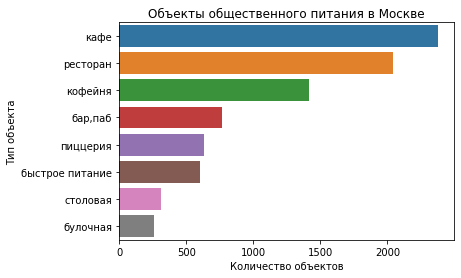

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [12]:
# Займёмся вопросом о распределении заведений по категориям.
temp = data.groupby('category').count().reset_index()
ax = sns.barplot(x='name', y='category', data=temp.sort_values('name', ascending=False))
ax.set_title('Объекты общественного питания в Москве')
ax.set_xlabel('Количество объектов')
ax.set_ylabel('Тип объекта')
plt.show()
display(temp[['category','name']].sort_values('name', ascending=False))

#### Вывод
Из анализа соотношения видов объектов общественного питания выявлено, что наибольшее количество объектов кафе (2378), ресторан(2043), кофейня (1413), бар/паб(765), пиццерия (633), быстрое питание (603), столовая (315), булочная (256).

In [13]:
# Исследуем количество посадочных мест в местах по категориям.
data.groupby(by='category', as_index=False).agg(
    min=('seats', 'min'),
    max=('seats', 'max'),
    mean=('seats', 'mean'),
    median=('seats', 'median')
)

,category,min,max,mean,median
0,"бар,паб",0.0,1288.0,124.532051,82.5
1,булочная,0.0,625.0,89.385135,50.0
2,быстрое питание,0.0,1040.0,98.891117,65.0
3,кафе,0.0,1288.0,97.512315,60.0
4,кофейня,0.0,1288.0,111.199734,80.0
5,пиццерия,0.0,1288.0,94.496487,55.0
6,ресторан,0.0,1288.0,121.944094,86.0
7,столовая,0.0,1200.0,99.750000,75.5


Можно заметить, что среднее и медианные значения достаточно сильно отличаются. Выделим следующие категории:
- 0 - заведения без посадочных мест
- 0-20 - заведения маленького размера
- 20-80 - заведения среднего размера
- 80-120 - заведения большjго размера
- 120+ - очень большие заведения

In [14]:
def categorization_seats(seats):
    if (seats != seats):
        return np.nan
    seats = int(seats)
    if (seats == 0):
        return '0'
    elif (seats <= 20):
        return '1 - 20'
    elif (seats <= 80):
        return '21 - 80'
    elif (seats <= 120):
        return '81 - 120'
    else:
        return '121 +'
    
data['seats_category'] = data['seats'].apply(categorization_seats)    

In [15]:
temp = data.groupby(['category', 'seats_category'], as_index=False).\
        agg(count=('category', 'count')).sort_values('count', ascending=False)
#print(temp)

fig = px.bar(temp, x='category', y='count', color='seats_category', barmode='group')
fig.update_layout(title='Распределение заведений по типам посадочных мест',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество заведений в категории')
fig.update_xaxes(tickangle=45)
fig.show() 

#### Вывод
На графике хорошо видно:
Видно, что во всех категориях заведений доминирует категория заведений среднего размера (от 21 до 80 посадочных мест). Следом в во всех категория идет заведение очень большего размера (от 121 посадочного места), потом заведения большего размера (от 81 до 120 посадочных мест), далее заведения маленького размера (от 1 до 20 посадочных мест).

In [16]:
# Соотношение сетевых и несетевых заведений в датасете
data_by_chain = data.groupby('chain')['name'].agg('count').reset_index()
name_chain = data_by_chain.index
values = data_by_chain['name']
print(values)
fig = go.Figure(data=[go.Pie(labels=name_chain, values=values)])
fig.update_layout(title='Распределение количества заведений по сетям')          
fig.show()

0    5201
1    3205
Name: name, dtype: int64


62% заведений не являются сетевыми, рассмотрим какие именно заведения чаще являются именно сетевыми.

In [17]:
temp = data.groupby(by=['category', 'chain'], as_index=False).agg(
    count=('name', 'count'))
temp.loc[temp['chain'] == 0, 'chain'] = 'is not chain'
temp.loc[temp['chain'] == 1, 'chain'] = 'is chain'
for i in range(len(temp)):
    temp.at[i, 'ratio'] = str(round(
        temp.loc[i]['count']/len(data[data['category'] == temp.loc[i]['category']]), 1) * 100) + '%'
temp

,category,chain,count,ratio
0,"бар,паб",is not chain,596,80.0%
1,"бар,паб",is chain,169,20.0%
2,булочная,is not chain,99,40.0%
3,булочная,is chain,157,60.0%
4,быстрое питание,is not chain,371,60.0%
5,быстрое питание,is chain,232,40.0%
6,кафе,is not chain,1599,70.0%
7,кафе,is chain,779,30.0%
8,кофейня,is not chain,693,50.0%
9,кофейня,is chain,720,50.0%


In [18]:
fig = px.bar(temp.sort_values(by='count', ascending=False), x='category', y='count',color='chain',text='ratio')
fig.update_layout(title='Распределение заведений по принадлежности к сети',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество заведений в категории')
fig.update_xaxes(tickangle=45)
fig.show() 

#### Вывод
Только 38% заведений являются сетевыми, cамые большие проценты сетевых заведений в следующих категориях: 60% булочная, 50% кофейня, пиццерия 50%, ресторан и быстрое питание по 40%

In [19]:
# Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве.
top_15 = data.groupby('name', as_index=False).agg(count=('category','count')).sort_values(by='count',ascending=False)
display(top_15.head(15))

black_list = data['category'].unique().tolist()
black_list.extend(['хинкальная', 'шаурма', 'чайхана'])
display(top_15[~top_15['name'].isin(black_list)].head(15))
top_15 = top_15[~top_15['name'].isin(black_list)].head(15)[
    'name'].tolist()

top_15 = data[data['name'].isin(top_15)]

,name,count
2825,кафе,189
5418,шоколадница,120
2532,домино'с пицца,77
2500,додо пицца,74
1137,one price coffee,72
5491,яндекс лавка,69
413,cofix,65
1263,prime,50
4993,хинкальная,44
5319,шаурма,43


,name,count
5418,шоколадница,120
2532,домино'с пицца,77
2500,додо пицца,74
1137,one price coffee,72
5491,яндекс лавка,69
413,cofix,65
1263,prime,50
3178,кофепорт,42
3236,кулинарная лавка братьев караваевых,39
4700,теремок,38


При группировке попали заведения без названия, мы ликвидируем их из расчётов, чтобы они не искажали исследование.

In [20]:
temp = top_15.groupby(['name', 'category'], as_index=False).agg(count=('category', 'count')).query('count>8')
fig = px.bar(temp, x='name', y='count',color='category')
fig.update_layout(title='Типы топ-15 заведений Москвы',
                   xaxis_title='Название',
                   yaxis_title='Количество заведений в категории')
fig.update_xaxes(tickangle=45)
fig.show() 

In [21]:
fig = px.scatter_mapbox(top_15, lat='lat', lon='lng', color='name', zoom=10, hover_name='name')
fig.update_geos(fitbounds="locations")
fig.update_layout(
        margin={"r": 0, "t": 0, "l": 0, "b": 0},
        mapbox_style="carto-positron"
    )
fig.show()

#### Вывод
Анализ списка из топ 15 самых популярных заведений показал:
- заведения являются сетевыми
- заведения либо расположены в центре города, либо равномерно покрывают весь город
- самые популярные категории кофейня, кафе, ресторан

In [22]:
# Какие административные районы Москвы присутствуют в датасете? 
# Отобразите общее количество заведений и количество заведений каждой категории по районам
data['district'].unique()


array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [23]:
temp = data.groupby(['district', 'category'], as_index=False)\
        .agg(count=('name', 'count')).sort_values('count', ascending=False)

fig = px.bar(temp, x='district', y='count',color='category', barmode='group')
fig.update_layout(width=800, height=800, title='Классификация заведений по районам',
                   xaxis_title='Округ',
                   yaxis_title='Количество заведений в округе')
fig.update_xaxes(tickangle=45)
fig.show() 

#### Вывод
Самый густонаселённый район по заведениям это ЦАО, с огромным количеством  ресторанов. В остальных округах превалируют кафе, но ресторанов ощутимое количество. Самый неосовенный рынок питания в СЗАО.

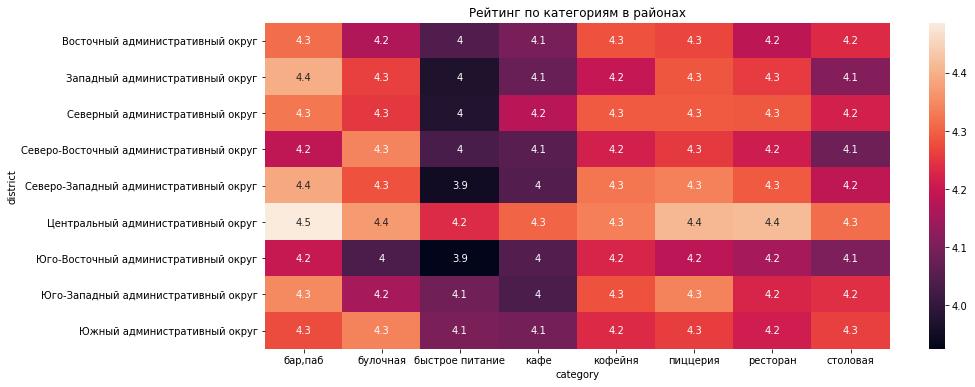

In [24]:
# Визуализируем распределение средних рейтингов по категориям заведений. 
temp = data.pivot_table(index='district',columns='category',values='rating', aggfunc='mean')
plt.figure(figsize=(14,6))
plt.title('Рейтинг по категориям в районах')
sns.heatmap(temp, annot=True)
plt.show()

#### Вывод
Самый высокйи рейтинг по всем районам у баров. Затем можем выделить пиццерии, кофейни и рестораны. Столовые и булочные отстают по пользовательским оценкам. Кафе и быстрое питание показывают себя хуже всех. Самые высокие оценки в ЦАО, а ЮВАО отличился самыми низкими рейтингами. 

In [25]:
# Постройм фоновую картограмму со средним рейтингом заведений каждого района.
temp = data.groupby('district', as_index=False)['rating'].agg('mean')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'rating'],
        key_on='feature.name',
        fill_color='BuGn',
        fill_opacity=0.8,
        legend_name='Средний рейтинг заведений по районам',
    ).add_to(m)
m

Полученная визуализация из нашего хороплёта не противоречит данным из heatmap.

In [26]:
# Отобразим все заведения датасета на карте с помощью кластеров
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [27]:
# Найдём топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.
temp = data.pivot_table(index='street',values='name',aggfunc='count').sort_values(by='name', ascending=False).head(15)
temp

,name
street,
проспект мира,184
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


In [28]:
top_15_street = data.query('street in @temp.index').groupby(['street', 'category'], as_index=False)\
                .agg(count=('name', 'count')).sort_values('count', ascending=False)

fig = px.bar(top_15_street, x='count', y='street', color='category', text='count', orientation='h')
fig.update_layout(title='Классификация заведений по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица')
fig.update_xaxes(tickangle=45)
fig.show() 

#### Вывод
Больше всего заведений на проспекте мира, профсожюзной, вернадского, ленинском и ленинградских проспектах. Популярнее всего кафе и рестораны.

In [29]:
# Найдём улицы, на которых находится только один объект общепита.
temp1 = data.pivot_table(index='street',values='name',aggfunc='count').sort_values(by='name', ascending=False).query('name < 2')
temp1

,name
street,
улица капотня,1
улица острякова,1
улица фотиевой,1
якиманский переулок,1
улица мжд киевское 5-й км,1
...,...
островная улица,1
отрадный проезд,1
павелецкая набережная,1


In [30]:
solo_street = data.query('street in @temp1.index').groupby('category', as_index=False)\
                .agg(count=('name', 'count')).sort_values('count', ascending=False)
fig = go.Figure(data=[go.Pie(labels=solo_street['category'], values=solo_street['count'], pull = [0.1, 0])])
fig.update_layout(title='Категории единственных заведений на улице')          
fig.show()

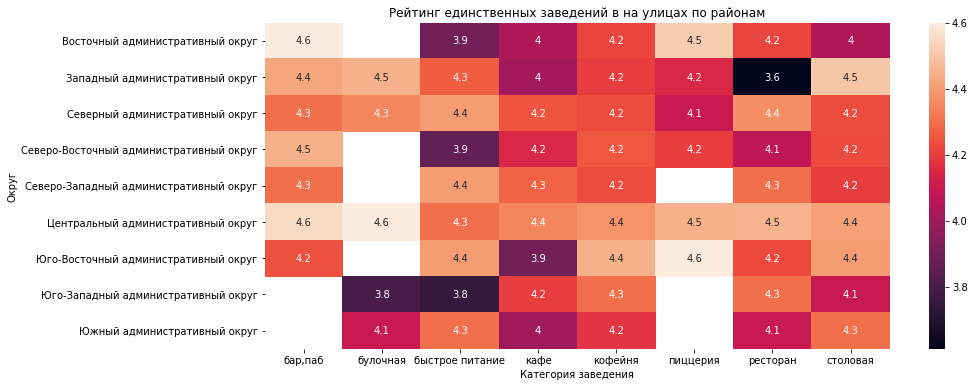

In [31]:
solo_street = data.query('street in @temp1.index').pivot_table(index='district',columns='category',values='rating', aggfunc='mean')
plt.figure(figsize=(14,6))
sns.heatmap(solo_street, annot=True)
plt.title('Рейтинг единственных заведений в на улицах по районам')
plt.xlabel('Категория заведения')
plt.ylabel('Округ')
plt.show()

#### Вывод
На улицах с единственными заведениями популярнее всего кафе, после идут рестораны и кофейни. При этом, рейтинги подобных заведений достаточно высокие. Возможно, открыть заведение с подобной локацией может быть выйгрышно в плане имиджа.

In [32]:
#Построим фоновую картограмму (хороплет) с медианой средних чеков для каждого района.
temp = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'middle_avg_bill'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Средний чек заведений по районам',
    ).add_to(m)
m

#### Вывод
Лидер по среднему чеку ЦАО, после идёт ЗАО, самые дешевые заведения на северо-востоке и юго-востоке, остальные районы не так сильно отличаются друг от друга. Подозреваю, что чем дороже недвижимость в районе, тем дороже стоит еда в заведениях.

In [33]:
#Исследуем круглосуточные заведения. Посмотрим на их количество по категориям и географию.
temp = data.query('is_24_7 == 1').groupby('district', as_index=False)['name'].agg('count')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'name'],
        key_on='feature.name',
        fill_color='YlOrRd',
        fill_opacity=0.8,
        legend_name='Количество круглосуточных заведений',
    ).add_to(m)
m


In [34]:
temp=data.query('is_24_7==True').groupby('category', as_index=False)\
        .agg(is_24_7=('is_24_7', 'count')).sort_values('is_24_7', ascending=False)

fig = px.bar(temp, x='category', y='is_24_7', text = 'is_24_7')
fig.update_layout(width=800, height=800, title='Количество круглосуточных заведений по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=45)
fig.show()

#### Вывод
Больше всего круглосутоных кафе, а также выделим быстрое питание и рестораны. Больше всего круглосуточных заведений в ЦАО, а вот в остальных районах показатель примерно одинаковый.

### Вывод
На основании построенных графиков, можем сделать следующие выводы:
- в Москве больше всего заведений в категориях кафе, ресторан и кофейня.
- чаще всего встречаются заведения среднего размера до 80 посадочных мест.
- 38% всех заведений являются сетевыми. Из них булочных 60% и 50% кофейня и пиццерия, 40% рестораны.
- самые популярные заведения сетевые, категории в них :кофейня, кафе, ресторан, булочная, пиццерия.
- больше всего заведений в ЦАО, здесь очень много ресторанов. Меньше всего заведений в СЗАО.
- самый высокий рейтинг по всем районам у баров, в отстающих быстрое питание, кафе. ЦАО оцененный район, а ЮВАО район с самыми низкими оценками.
- Больше всего заведений на проспекте мира, профсожюзной, вернадского, ленинском и ленинградских проспектах. Популярнее всего кафе и рестораны.
- На улицах с единственными заведениями популярнее всего кафе, после идут рестораны и кофейни. При этом, рейтинги подобных заведений достаточно высокие.
- самый высокий средний чек в ЦАО и ЗАО, а на востоке города средний чек значительно ниже.
- чаще всего круглосутоными являются кафе, быстрое питание и рестораны. Чаще круглосуточные заведения встречаютсяв центре города, реже - в восточной его части.

## Детализируем исследование: открытие кофейни

In [35]:
# Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
coffee = data.query('category == "кофейня"')
temp = coffee.groupby('district')['name'].agg('count').sort_values()
fig = px.bar(temp, x=temp.values, y=temp.index, text = temp.values)
fig.update_layout(width=800, height=800, title='Количество кофеен по районам Москвы',
                   xaxis_title='Количество',
                   yaxis_title='Район')
fig.update_xaxes(tickangle=45)
fig.show()

In [36]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'name'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Количество кофеен в районе',
    ).add_to(m)
m

#### Вывод
Как и ожидалось, больше всего кофеен в центральном районе Москвы. Самые незаселённые места, это южное  и восточное направление города. 

In [37]:
# Есть ли круглосуточные кофейни?
print('Всего круглосуточных кофеен:', coffee['is_24_7'].sum())

Всего круглосуточных кофеен: 59


In [38]:
temp = coffee.query('is_24_7 == 1').groupby('district')['name'].agg('count').sort_values()
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'name'],
        key_on='feature.name',
        fill_color='PuRd',
        fill_opacity=0.8,
        legend_name='Количество круглосуточных кофеен в районе',
    ).add_to(m)
m

#### Вывод
Круглосуточные заведения встречаются только в "дорогих" районах Москвы. Их не так много, по отношению к общему количеству.

In [39]:
#Какие у кофеен рейтинги? Как они распределяются по районам?
temp = coffee.groupby('district')['rating'].agg('median').sort_values()
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'name'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Средний рейтинг кофейни в районе',
    ).add_to(m)
m

#### Вывод
Рейтинг кофеен довольно однороден по всему городу, но выбиваются кофейни в западной части, здесь средний рейтинг значительно ниже.

In [40]:
# На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
print(f"Максимальная стоимость чашки {coffee['middle_coffee_cup'].max()}, а минимальная - {coffee['middle_coffee_cup'].min()}")
print(coffee['middle_coffee_cup'].describe())

Максимальная стоимость чашки 1568.0, а минимальная - 60.0
count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64


In [41]:
temp = coffee.groupby('district')['middle_coffee_cup'].agg('median').sort_values()
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'name'],
        key_on='feature.name',
        fill_color='RdPu',
        fill_opacity=0.8,
        legend_name='Средняя цена чашки кофе в кофейне',
    ).add_to(m)
m

#### Вывод
Можно порекомендовать продавать чашку кофе по 170руб, чтобы на старте оказаться в рынке. Более того, есть гипотеза, почему на западе низкие оценки: качество не оправдывает цену.

In [42]:
# Сколько посадочных мест предусмотреть в кофейне?
print(coffee['seats'].describe())

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64


In [43]:
temp = coffee.groupby('district')['seats'].agg('median').sort_values()
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
        geo_data=state_geo,
        data=temp,
        columns=['district', 'name'],
        key_on='feature.name',
        fill_color='BuGn',
        fill_opacity=0.8,
        legend_name='Среднее число посадочных мест в кофейне',
    ).add_to(m)
m

#### Вывод
Самые большие кофейни находятся в западной и центральной части города, а  самые маленькие- в восточной. Не рекомендую открывать кофейню с количеством посадочных мест больше 50.

### Рекомендации
- Самое большое количество кофеен в центре. Самым сбалансированным положением будет юго-запад, юго-восток города. 
- В городе очень мало круглосуточных кофеен, и большая часть из них расположена в центре. Подозреваю, что нет смысла переламывать привычную модель клиента, открывая круглосуточное заведение на окраине. 
- Самые большие, самые низкие пользовательские оценки и самые высокие чеки находятся в западном районе. Стоит избегать данный район.
- Стоимость чашки капучино должна быть 170 рублей. Это медианная цена по городу, считаю, что решение будет сбалансированным.
- Не имеет смысла стартовать с большого заведения, рекомендация открыть заведение 50 посадочных мест.

Презентация на диске: https://disk.yandex.ru/i/Ccle8wFwPALPBg